In [ ]:
"""installs"""

# !pip install nc-time-axis
# !pip install netCDF4 h5netcdf
# !pip install xarray
# !pip install cdsapi
# !pip install networkx geopandas osmnx igraph matplotlib


'installs'

In [ ]:
# pip install joypy


In [ ]:
# pip install pysal scikit-learn libpysal tobler geopandas numpy pandas networkx
# !pip install access


## 0. Main imports & definitions

In [1]:
import sys
from pathlib import Path

# Add parent directory to Python path to enable imports from scripts/
module_path = str(Path.cwd().parent)
if module_path not in sys.path:
    sys.path.append(module_path)

import scripts_old.model as model
import scripts_old.provision as provision


In [2]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize


In [3]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import pandas as pd
import geopandas as gpd
import os
from tqdm import tqdm

tqdm.pandas()


In [4]:
"""
winter_tr -- это должно быть зимники?
"""

KELVIN_TO_CELSIUS = 273.15

# ??????????????????
UTM_CRS = 2693
MINUTES_IN_HOUR = 60

DEMAND_COL = "demand_without"
SERVICE_NAME = "hospital"
SETTL_NAME = "yakut_chuk"
CONST_BASE_DEMAND = 120  # if not known (!)
SERVICE_RADIUS_MINUTES = 60 * 13


In [5]:
transport_modes = [
    "car_warm",
    "plane",
    "water_ship",
    "water_boat",
    "car_cold",
    "winter_tr",
]


In [6]:
main_data_path = "D:/article/SC_climate_framed_urban_networks/data/Арктика/"


## 1. Data reading & cleaning

In [7]:
settl = gpd.read_file(f"../data/processed/df_settlements_{SETTL_NAME}.geojson").to_crs(
    UTM_CRS
)
settl["name"] = settl["name"].str.replace("ё", "е")
settl.geometry = settl.geometry.buffer(1e3)


In [8]:
transport_df = (
    gpd.read_file(f"../data/processed/df_time_{SETTL_NAME}.geojson")
    .to_crs(UTM_CRS)
    .dropna(subset=["geometry"])
)
# Convert mode values from ',' to '.' and ensure they are float
for mode in transport_modes:
    transport_df[mode] = (
        transport_df[mode].astype(str).str.replace(",", ".").astype(float)
    )
transport_df["edge1"] = transport_df["edge1"].str.replace("ё", "е")
transport_df["edge2"] = transport_df["edge2"].str.replace("ё", "е")


In [9]:
transport_df[transport_modes] *= MINUTES_IN_HOUR  # convert from hours to minutes
transport_df[transport_modes] = transport_df[transport_modes].round(0)


In [10]:
infr_df = pd.read_csv(f"../data/raw/infrastructure_{SETTL_NAME}.csv", sep=";")
# Fill NaNs with 0
infr_df.fillna(0, inplace=True)
infr_df["name"] = infr_df["name"].str.replace("ё", "е")



In [11]:
df_service = gpd.read_file(
    f"../data/processed/df_{SERVICE_NAME}_{SETTL_NAME}.geojson"
).to_crs(UTM_CRS)

df_service["name"] = df_service["name"].str.replace("ё", "е")


# 1.1 Some visuals

In [12]:
settl.explore(tiles="cartodbpositron")


In [13]:
transport_df.explore(tiles="cartodbpositron")


In [14]:
msk1 = transport_df["car_cold"] == 0
msk2 = transport_df["car_warm"] != 0

transport_df[msk1 & msk2].explore(tiles="cartodbpositron")


In [ ]:
# !pip install -U geopandas


In [13]:
import folium
from folium import FeatureGroup
import geopandas as gpd

transport_df = transport_df.to_crs(4326)

x = transport_df.union_all().centroid.x
y = transport_df.union_all().centroid.y


import folium
from folium import FeatureGroup
import geopandas as gpd

# Start a base map
m = folium.Map(
    location=[x, y], zoom_start=5, tiles="cartodbpositron", control_scale=True
)

# Define transport columns you want to show as layers
transport_cols = transport_modes

# Color palette just for better visibility
colors = ["red", "blue", "green", "purple", "orange", "black"]

# Create a layer for each transport type
for mode, color in zip(transport_cols, colors):
    fg = FeatureGroup(name=mode)

    # Filter edges with non-zero availability for this transport type
    gdf_filtered = transport_df[transport_df[mode] > 0]

    # Add each geometry as a line to the FeatureGroup
    for _, row in gdf_filtered.iterrows():
        folium.PolyLine(
            locations=[(coord[1], coord[0]) for coord in row["geometry"].coords],
            color=color,
            tooltip=f"{row['edge1']} ↔ {row['edge2']} ({mode})",
            weight=3,
        ).add_to(fg)

    fg.add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Display the map
display(m)
transport_df = transport_df.to_crs(UTM_CRS)


In [14]:
import geopandas as gpd
import folium

settl = settl.to_crs(4326)
m = folium.Map(
    location=[x, y],
    zoom_start=5,
    tiles="cartodbpositron",
    control_scale=True,
)
# Create a FeatureGroup for settl
settl_fg = folium.FeatureGroup(name="Settlements")

# Add points as markers (or use folium.GeoJson for styling polygons)
for _, row in settl.iterrows():
    folium.CircleMarker(
        location=(row.geometry.centroid.y, row.geometry.centroid.x),
        radius=8,
        popup=transport_modes,
        color="darkgreen",
        fill=True,
        fill_opacity=0.7,
    ).add_to(settl_fg)

settl_fg.add_to(m)

# Add layer control to toggle layers
folium.LayerControl().add_to(m)

display(m)
settl = settl.to_crs(UTM_CRS)


In [17]:
df_service[df_service["capacity"] == 0].explore(
    column="capacity", cmap="RdYlGn", tiles="cartodbpositron"
)


In [18]:
transport_df.head(2)


,edge1,edge2,car_warm,plane,water_ship,water_boat,car_cold,winter_tr,mean_time,water,winter,geometry
0,Алеко-Кюёль,Билибино,0.0,0.0,0.0,0.0,0.0,2194.0,2194,False,True,"LINESTRING (58504565.15 7829260.532, 59061356...."
1,Алеко-Кюёль,Сватай,0.0,0.0,0.0,0.0,0.0,264.0,264,False,True,"LINESTRING (58504966.699 7827013.99, 58473476...."


In [19]:
settl.head(2)


,id,name,population,geometry
0,0,Алеко-Кюель,512,"POLYGON ((58505505.484 7829190.457, 58505500.6..."
1,1,Андрюшкино,741,"POLYGON ((58623109.664 7840844.823, 58623104.8..."


# 2. Preprocessing

### 2.1 Blocks scheme creation

In [13]:
blocks_gdf = model.create_blocks(settl, const_demand=CONST_BASE_DEMAND, epsg=UTM_CRS)
blocks_gdf = model.update_blocks_with_services(
    blocks_gdf, df_service, service_type=SERVICE_NAME
)


In [14]:
blocks_gdf.head(2)


,id,name,geometry,population,epsg,capacity_hospital
0,0,Алеко-Кюель,"POLYGON ((58505505.484 7829190.457, 58505500.6...",512,2693,500
1,1,Андрюшкино,"POLYGON ((58623109.664 7840844.823, 58623104.8...",741,2693,1000


### 2.2 Graph creation

In [15]:
transport_modes

['car_warm', 'plane', 'water_ship', 'water_boat', 'car_cold', 'winter_tr']

In [22]:
# Convert G to an undirected graph
G_undirected = nx.MultiGraph()

# Add edges from transport_df
for _, row in transport_df.iterrows():
    for mode in transport_modes:
        if row[mode] != 0:
            G_undirected.add_edge(
                row["edge1"],
                row["edge2"],
                weight=round(row[mode], 2),
                label=mode,
            )

            G_undirected.add_edge(
                row["edge2"],
                row["edge1"],
                weight=round(row[mode], 2),
                label=mode,
            )

# Add node properties from blocks_gdf dataframe
for _, row in blocks_gdf.iterrows():
    node = row["name"]
    if node in G_undirected.nodes:
        for col in blocks_gdf.columns:
            # if col != "geometry":  # Skip geometry column
            G_undirected.nodes[node][col] = row[col]

            if col == "geometry":
                # Convert geometry to WKT format
                geom = row[col]
                if geom is not None:
                    G_undirected.nodes[node]["x"] = geom.centroid.x
                    G_undirected.nodes[node]["y"] = geom.centroid.y
                else:
                    G_undirected.nodes[node]["x"] = None
                    G_undirected.nodes[node]["y"] = None

G_undirected.graph["crs"] = settl.crs.to_epsg()


In [57]:
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as MplPolygon
from matplotlib.collections import PatchCollection
import networkx as nx
from shapely.geometry import Polygon, MultiPolygon

def plot_transport_graph(G, figsize=(14, 10), title="Transport Graph with modes"):
    fig, ax = plt.subplots(figsize=figsize)

    patches = []

    # Рисуем полигоны узлов (фон)
    for n, d in G.nodes(data=True):
        geom = d.get("geometry")
        if isinstance(geom, Polygon) and not geom.is_empty:
            patches.append(MplPolygon(list(geom.exterior.coords), closed=True))
        elif isinstance(geom, MultiPolygon):
            for part in geom.geoms:
                if isinstance(part, Polygon) and not part.is_empty:
                    patches.append(MplPolygon(list(part.exterior.coords), closed=True))

    if patches:
        pc = PatchCollection(
            patches,
            facecolor="#eeeeee", edgecolor="black", alpha=0.5
        )
        ax.add_collection(pc)

    # Позиции узлов
    pos = {n: (d.get("x"), d.get("y")) for n, d in G.nodes(data=True)}

    # Цвета для разных транспортных мод
    mode_colors = {
        "plane": "red",
        "car_warm": "green",
        "winter_tr": "blue",
        "car_cold": "purple",
        "water_boat": "orange"
    }

    # Рисуем рёбра разными цветами
    for u, v, data in G.edges(data=True):
        label = data.get("label")
        color = mode_colors.get(label, "gray")
        if pos[u] is not None and pos[v] is not None:
            x_values = [pos[u][0], pos[v][0]]
            y_values = [pos[u][1], pos[v][1]]
            ax.plot(x_values, y_values, color=color, alpha=0.7, linewidth=1.5)

    # Рисуем узлы
    nx.draw_networkx_nodes(
        G, pos, node_size=50, node_color="#ffcc00", edgecolors="black", ax=ax
    )

    # Подписи узлов
    nx.draw_networkx_labels(G, pos, font_size=10, ax=ax)

    # Легенда для видов транспорта
    handles = [
        plt.Line2D([0], [0], color=color, lw=2, label=label)
        for label, color in mode_colors.items()
    ]
    ax.legend(handles=handles, title="Transport mode", loc="upper right", fontsize=10)

    ax.set_title(title, fontsize=16)
    ax.set_aspect('equal')
    ax.axis('off')
    plt.tight_layout()
    plt.show()


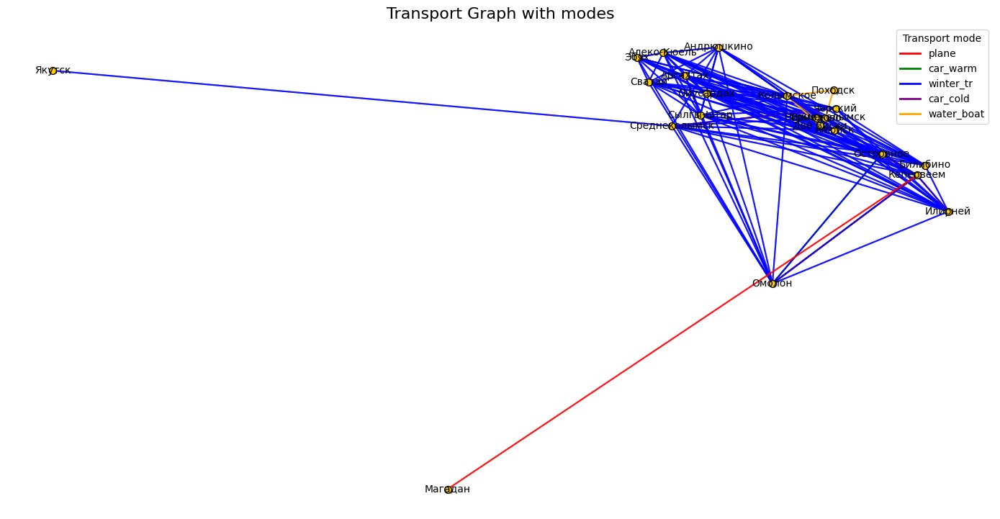

In [56]:
plot_transport_graph(G_undirected, figsize=(14, 10), title="Transport Graph with modes")

In [36]:
transport_df['edge1'].nunique(), transport_df['edge2'].nunique(), 

(17, 20)

In [37]:
blocks_gdf['name'].nunique()

25

In [38]:
blocks_gdf[~(blocks_gdf['name'].isin(transport_df['edge1'].unique()))]['name'].unique()

array(['Березовка', 'Билибино', 'Две Виски', 'Магадан', 'Михалкино',
       'Походск', 'Хатынгнах', 'Якутск'], dtype=object)

In [39]:
blocks_gdf[~blocks_gdf['name'].isin(transport_df['edge2'].unique())]['name'].unique()

array(['Анюйск', 'Березовка', 'Кепервеем', 'Михалкино', 'Хатынгнах'],
      dtype=object)

In [40]:
from pprint import pprint

pprint(list(G_undirected.nodes(data=True))[3:])


[('Андрюшкино',
  {'capacity_hospital': 1000,
   'epsg': 2693,
   'geometry': <POLYGON ((58623109.664 7840844.823, 58623104.848 7840746.806, 58623090.449 ...>,
   'id': 1,
   'name': 'Андрюшкино',
   'population': 741,
   'x': 58622109.663679525,
   'y': 7840844.823269255}),
 ('Аргахтах',
  {'capacity_hospital': 500,
   'epsg': 2693,
   'geometry': <POLYGON ((58552171.503 7780684.823, 58552166.688 7780586.805, 58552152.289 ...>,
   'id': 3,
   'name': 'Аргахтах',
   'population': 469,
   'x': 58551171.503380574,
   'y': 7780684.822506347}),
 ('Ойусардах',
  {'capacity_hospital': 500,
   'epsg': 2693,
   'geometry': <POLYGON ((58596703.771 7742687.954, 58596698.956 7742589.937, 58596684.556 ...>,
   'id': 14,
   'name': 'Ойусардах',
   'population': 530,
   'x': 58595703.770883605,
   'y': 7742687.953992059}),
 ('Среднеколымск',
  {'capacity_hospital': 0,
   'epsg': 2693,
   'geometry': <POLYGON ((58524005.739 7673352.287, 58524000.924 7673254.27, 58523986.524 7...>,
   'id': 19,
   'na

### 2.4.0 nasa

In [59]:
"""берем нижнюю и верхнюю температуры"""

import requests
from pathlib import Path
import geopandas as gpd
from shapely.geometry import Point
import os
import json
from tqdm import tqdm

# Приводим к WGS84
blocks_gdf = blocks_gdf.to_crs(4326)

# Параметры
start_date = "19820101"
end_date = "20241201"
parameters = "T2M"

# Папка для кэша
output_dir = "../data/climate_data_blocks"
Path(output_dir).mkdir(exist_ok=True, parents=True)

# Будем собирать результаты
climate_results = []

for idx, row in tqdm(blocks_gdf.iterrows(), total=len(blocks_gdf)):
    name = row["name"]
    centroid: Point = row["geometry"].centroid
    lon, lat = centroid.x, centroid.y

    out_file = os.path.join(output_dir, f"{name}_{start_date}_{end_date}.json")

    if os.path.exists(out_file):
        with open(out_file, "r") as f:
            data = json.load(f)
    else:
        url = (
            f"https://power.larc.nasa.gov/api/temporal/daily/point"
            f"?parameters={parameters}"
            f"&community=RE"
            f"&longitude={lon}&latitude={lat}"
            f"&start={start_date}&end={end_date}"
            f"&format=JSON"
        )
        r = requests.get(url)
        r.raise_for_status()
        data = r.json()
        with open(out_file, "w") as f:
            json.dump(data, f)

    temperature = data["properties"]["parameter"]["T2M"]

    climate_results.append(
        {"name": name, "lon": lon, "lat": lat, "temperature": temperature}
    )


  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:06<00:00,  4.00it/s]


In [ ]:
df_climate = pd.DataFrame(climate_results)

df_climate.head()


,name,lon,lat,temperature
0,Алеко-Кюель,151.878675,68.678757,"{'19820101': -35.19, '19820102': -36.24, '1982..."
1,Андрюшкино,154.448853,69.171997,"{'19820101': -34.59, '19820102': -34.58, '1982..."
2,Анюйск,161.560434,68.345191,"{'19820101': -32.23, '19820102': -34.51, '1982..."
3,Аргахтах,153.376959,68.443342,"{'19820101': -34.98, '19820102': -35.82, '1982..."
4,Березовка,156.585217,67.129609,"{'19820101': -34.43, '19820102': -38.01, '1982..."


In [61]:
df_climate.to_csv(f'../data/climate_data_blocks/df_climate_{SETTL_NAME}.csv')

In [62]:
import pandas as pd

climate_records = []

for _, row in df_climate.iterrows():
    name = row["name"]
    lon = row["lon"]
    lat = row["lat"]
    temp_dict = row["temperature"]

    # Convert dict to Series → DataFrame
    temp_series = pd.Series(temp_dict).astype(float)
    temp_series.index = pd.to_datetime(temp_series.index, format="%Y%m%d")
    temp_df = temp_series.rename("temperature").reset_index()
    temp_df = temp_df.rename(columns={"index": "date"})

    # Compute month
    temp_df["month"] = temp_df["date"].dt.to_period("M")

    # Group and convert to list
    monthly_avg = (
        temp_df.groupby("month")["temperature"]
        .mean()
        .sort_index()
        .tolist()  # 👈 collapse to list
    )

    climate_records.append(
        {
            "name": name,
            "lon": lon,
            "lat": lat,
            "monthly_temperature": [int(round(x)) for x in monthly_avg],  # round to int
        }
    )

df_monthly_list = pd.DataFrame(climate_records)
df_monthly_list


,name,lon,lat,monthly_temperature
0,Алеко-Кюель,151.878675,68.678757,"[-40, -33, -26, -14, -5, 9, 14, 11, 4, -11, -3..."
1,Андрюшкино,154.448853,69.171997,"[-39, -33, -25, -15, -6, 8, 13, 10, 4, -10, -3..."
2,Анюйск,161.560434,68.345191,"[-38, -28, -25, -14, -4, 9, 13, 10, 3, -10, -3..."
3,Аргахтах,153.376959,68.443342,"[-40, -33, -26, -14, -5, 9, 14, 11, 4, -11, -3..."
4,Березовка,156.585217,67.129609,"[-40, -31, -26, -13, -3, 9, 13, 9, 3, -10, -31..."
5,Билибино,166.445075,68.055201,"[-33, -24, -25, -16, -7, 5, 10, 7, 0, -12, -30..."
6,Две Виски,160.757411,68.361617,"[-39, -29, -25, -14, -4, 9, 14, 11, 4, -10, -3..."
7,Ермолово,160.486753,68.482815,"[-39, -29, -25, -14, -4, 9, 14, 11, 4, -10, -3..."
8,Илирней,167.962516,67.255518,"[-31, -22, -24, -17, -7, 3, 8, 6, -1, -13, -29..."
9,Кепервеем,166.142899,67.841577,"[-33, -24, -25, -16, -7, 5, 10, 7, 0, -12, -30..."


In [63]:
for node in G_undirected.nodes:
    if (
        G_undirected.nodes[node]['x'] is not None
        and G_undirected.nodes[node]['y'] is not None
    ):
        name = G_undirected.nodes[node]["name"]

        # Extract temperature data for the node's coordinates
        city_temp = df_monthly_list[df_monthly_list["name"] == name][
            "monthly_temperature"
        ].squeeze()
        G_undirected.nodes[node]["temperature"] = pd.DataFrame(
            city_temp, columns=["temperature"]
        ).round(0)

        # G_undirected.nodes[node]["season"] = G_undirected.nodes[node][
        #     "temperature"
        # ].map(get_season_by_temperature)


### 2.4 Copernicus temperature data collection

In [ ]:
# import glob
# import zipfile

# # Create folder structure for climate data
# climate_data_dir = f"../data/climate_data/{SETTL_NAME}"
# Path(climate_data_dir).mkdir(parents=True, exist_ok=True)

# # Check if data already exists
# nc_file = None
# unzip_folder = os.path.join(climate_data_dir, "extracted")
# if os.path.exists(unzip_folder):
#     nc_files = glob.glob(os.path.join(unzip_folder, "*.nc"))
#     if nc_files:
#         nc_file = nc_files[0]
#         print(f"Using existing NetCDF file: {nc_file}")
#         climate_data = True
#     else:
#         climate_data = False
# else:
#     climate_data = False

# # Only download if data doesn't exist
# if not climate_data:
#     print("Downloading climate data...")
#     import cdsapi

#     dataset = "projections-cmip6"
#     request = {
#         "temporal_resolution": "monthly",
#         "experiment": "ssp5_8_5",
#         "variable": "air_temperature",
#         "level": ["1000"],
#         "model": "inm_cm5_0",
#         "year": [str(year) for year in range(2025, 2050, 1)],
#         "month": [
#             "01",
#             "02",
#             "03",
#             "04",
#             "05",
#             "06",
#             "07",
#             "08",
#             "09",
#             "10",
#             "11",
#             "12",
#         ],
#         "area": [90, -180, -90, 180],  # Global area????????
#     }

#     client = cdsapi.Client()
#     output_file = os.path.join(climate_data_dir, f"temperature_data_{SETTL_NAME}.zip")
#     client.retrieve(dataset, request).download(output_file)

#     # Extract downloaded data
#     Path(unzip_folder).mkdir(exist_ok=True)
#     with zipfile.ZipFile(output_file, "r") as zip_ref:
#         zip_ref.extractall(unzip_folder)

#     # Find extracted .nc file
#     nc_files = glob.glob(os.path.join(unzip_folder, "*.nc"))
#     if nc_files:
#         nc_file = nc_files[0]
#         print(f"Downloaded and extracted NetCDF file: {nc_file}")
#     else:
#         raise FileNotFoundError("No .nc file found in the extracted data")

# # Load the data
# import xarray as xr

# ds = xr.open_dataset(nc_file)
# print(ds)

# # Save dataset metadata for reference
# metadata_file = os.path.join(climate_data_dir, "metadata.txt")
# with open(metadata_file, "w") as f:
#     f.write(str(ds))


In [ ]:
# !pip install xarray
# !pip install netcdf4 h5netcdf
# !pip install pysal


In [ ]:
# # def get_season_by_temperature(temp):
# #     if temp < -10:
# #         return "winter"
# #     elif temp > 5:
# #         return "summer"
# #     else:
# #         return "midseason"


# for node in G_undirected.nodes:
#     if (
#         G_undirected.nodes[node]["x"] is not None
#         and G_undirected.nodes[node]["y"] is not None
#     ):
#         lon = G_undirected.nodes[node]["x"]
#         lat = G_undirected.nodes[node]["y"]

#         # Extract temperature data for the node's coordinates
#         city_temp = ds["ta"].sel(lat=lat, lon=lon, method="nearest") - KELVIN_TO_CELSIUS
#         G_undirected.nodes[node]["temperature"] = pd.DataFrame(
#             city_temp, columns=["temperature"]
#         ).round(0)

#         # G_undirected.nodes[node]["season"] = G_undirected.nodes[node][
#         #     "temperature"
#         # ].map(get_season_by_temperature)


### 2.5 Prov calc

In [ ]:
# from scripts.provision2 import calculate_graph_provision

# # 1. Get results from new implementation
# result = calculate_graph_provision(
#     G_undirected,
#     SERVICE_RADIUS_MINUTES,
# )

# result["provision_supply"] = [1 if i > 1 else i for i in result["provision_supply"]]
# result["name"] = np.array(
#     [data.get("name") for _, data in G_undirected.nodes(data=True)]
# )
# blocks_gdf = blocks_gdf.join(result.set_index("name"), on="name", rsuffix="_provision")
# # result


In [ ]:
# # 5. Visualize results on map (using existing visualization code)
# blocks_gdf.to_crs(UTM_CRS).explore(
#     column="provision_supply",
#     cmap="RdYlGn",
#     legend=True,
#     tooltip=["provision_supply"],
#     name="Provision",
#     style_kwds={"fillOpacity": 0.7},
#     tiles="cartodbpositron",
# )


# 4. Ok so to the modelling again...

### Для третьего года (2035) плохие показатели это ок согласно картинкам ниже с графиком изменения температур(ы)

In [64]:
threshold = 0.55


In [65]:
def sigmoid(x, center, steepness=1):
    """
    Sigmoid function for smooth probability transition
    center: temperature at which probability is 0.5
    steepness: controls how sharp the transition is
    """
    return 1 / (1 + np.exp(-steepness * (x - center)))


def get_transport_probability(transport_type, temperature):
    """
    Calculate transport probability based on temperature using smooth transitions
    """
    if transport_type == "plane":
        # Planes work better in warmer weather, degrading below -10°C
        return np.round(sigmoid(temperature, -45, 0.5), 5)

    elif transport_type in ["water_boat", "water_ship"]:
        # Water transport needs above-freezing temperatures
        return np.round(sigmoid(temperature, 0, 0.8), 5)

    elif transport_type == "car_warm":
        # Regular cars work better in warm weather
        return np.round(sigmoid(temperature, 7, 0.7), 5)

    elif transport_type in ["car_cold", "winter_tr"]:
        # Winter transport works better in cold weather
        return 1 - np.round(sigmoid(temperature, -11, 1), 5)

    return -1e6


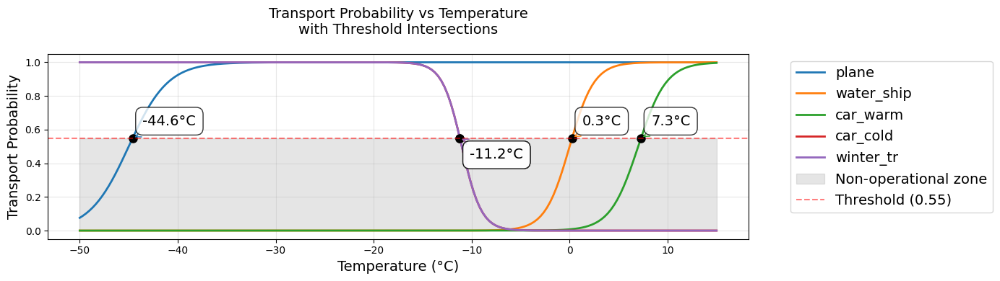

In [66]:
import matplotlib.pyplot as plt
import numpy as np


# Create temperature range and transport types
temps = np.linspace(-50, 15, 200)
transport_types = ["plane", "water_ship", "car_warm", "car_cold", "winter_tr"]

# Create figure with increased size
plt.figure(figsize=(14, 4))

# Plot probability curves and find threshold intersections
for t_type in transport_types:
    probs = [get_transport_probability(t_type, t) for t in temps]
    (line,) = plt.plot(temps, probs, label=t_type, linewidth=2)

    # Find intersection points with threshold
    for i in range(len(temps) - 1):
        if (probs[i] - threshold) * (probs[i + 1] - threshold) <= 0:
            # Linear interpolation to find exact intersection
            t_intersect = temps[i] + (temps[i + 1] - temps[i]) * (
                threshold - probs[i]
            ) / (probs[i + 1] - probs[i])
            plt.plot(t_intersect, threshold, "ko", markersize=8)
            plt.annotate(
                f"{t_intersect:.1f}°C",
                (t_intersect, threshold),
                xytext=(10, 10 if probs[i] < threshold else -10),
                textcoords="offset points",
                ha="left",
                va="bottom" if probs[i] < threshold else "top",
                bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.8),
                arrowprops=dict(arrowstyle="->", color=line.get_color()),
                fontsize=14,
            )

# Add grey shading for area below threshold
plt.fill_between(
    temps, 0, threshold, color="grey", alpha=0.2, label="Non-operational zone"
)


# Add threshold line
plt.axhline(
    y=threshold, color="r", linestyle="--", alpha=0.5, label=f"Threshold ({threshold})"
)

plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Transport Probability", fontsize=14)
plt.title(
    "Transport Probability vs Temperature\nwith Threshold Intersections",
    fontsize=14,
    pad=20,
)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### The main calculations

In [67]:
import networkx as nx
import pandas as pd
import numpy as np


class Statistics:
    def __init__(self):
        self.records = pd.DataFrame(
            columns=[
                "idx",
                "mean",
                "min",
                "max",
                "median",
            ]
        )
        self.graphs = list()
        self.results = list()

    def add_record(self, step_index, metrics: dict, G, result):
        new_row = pd.DataFrame(
            [
                {
                    "idx": step_index,
                    "mean": metrics.get("mean"),
                    "min": metrics.get("min"),
                    "max": metrics.get("max"),
                    "median": metrics.get("median"),
                }
            ]
        )
        self.records = pd.concat([self.records, new_row], ignore_index=True)
        self.graphs.append(G)
        self.results.append(result)

    def summary(self):
        return self.records.pivot_table(index="idx", columns="col", values="mean")

    def full(self):
        return self.records


class AgglomerationNetwork:
    def __init__(self, graph, threshold):
        self.original_graph = graph.copy()
        self.graph = graph.copy()
        self.threshold = threshold
        self.stats = Statistics()
        self.current_step = 0  # Initialize current_step

    def _get_edge_temperature(self, G, u, v, idx, key):
        """
        RULE: least suitable temperature of the two nodes
        тк большинсво связей это самолеты(?)
        """

        temp_u = G.nodes[u].get("temperature").loc[idx].item()
        temp_v = G.nodes[v].get("temperature").loc[idx].item()

        if G.edges[u, v, key]["label"] in ["car_cold", "winter_tr"]:
            return np.round(np.max([temp_u, temp_v]), 1)
        else:
            return np.round(np.min([temp_u, temp_v]), 1)

    def assign_edge_temperatures(self, G, idx):
        for u, v, key in G.edges(keys=True):
            G.edges[u, v, key]["temperature"] = self._get_edge_temperature(
                G, u, v, idx, key
            )

        return G

    def assign_transport_probabilities(self, G):
        """
        Assigns smooth transport probabilities based on temperature
        """
        for _, _, data in G.edges(data=True):
            transport_type = data.get("label")
            temperature = data.get("temperature")
            if transport_type and temperature:
                data["transport_probability"] = get_transport_probability(
                    transport_type, temperature
                )
            else:
                data["transport_probability"] = -1e3

    def filter_edges_by_probability(self, G, threshold):
        """
        Возвращает копию графа G, содержащую только те рёбра,
        у которых transport_probability >= threshold
        """
        G_filtered = nx.Graph()
        G_filtered.add_nodes_from(G.nodes(data=True))

        for u, v, data in G.edges(data=True):
            # print(f"edge: {u} - {v}, data: {data}")
            prob = data.get("transport_probability", 0.0)
            if prob >= threshold:
                G_filtered.add_edge(u, v, **data)
        G_filtered.graph["crs"] = G.graph["crs"]
        return G_filtered

    def run_all_steps(self, idx):
        self.current_step = idx  # Update current_step
        self.assign_edge_temperatures(self.graph, idx)
        self.assign_transport_probabilities(self.graph)
        G_filtered = self.filter_edges_by_probability(
            self.graph, threshold=self.threshold
        )

        G, result, A = provision.calculate_graph_provision(
            G_filtered,
            SERVICE_RADIUS_MINUTES,
            CONST_BASE_DEMAND,
            service_name=SERVICE_NAME,
            return_assignment=True,
        )

        # display(result)

        avg_provision = result["provision"].mean().round(2)
        min_provision = result["provision"].min().round(2)
        max_provision = result["provision"].max().round(2)
        median_provision = result["provision"].median().round(2)

        other_metrics = {
            "mean": avg_provision,
            "min": min_provision,
            "max": max_provision,
            "median": median_provision,
        }
        metrics = {**other_metrics}

        self.stats.add_record(step_index=idx, metrics=metrics, G=G, result=result)


net = AgglomerationNetwork(graph=G_undirected, threshold=threshold)

range_year = range(list(G_undirected.nodes(data=True))[0][1]["temperature"].shape[0])

for idx in tqdm(range_year):
    net.run_all_steps(idx)

df_stats = net.stats.records


100%|██████████| 516/516 [01:15<00:00,  6.81it/s]


In [68]:
pprint(list(net.stats.graphs[0].edges(data=True)))


Pretty printing has been turned OFF


In [78]:
df_stats


,idx,mean,min,max,median
0,0,0.50,0.0,1.0,0.52
1,1,0.50,0.0,1.0,0.52
2,2,0.50,0.0,1.0,0.52
3,3,0.64,0.0,1.0,1.00
4,4,0.73,0.0,1.0,1.00
...,...,...,...,...,...
511,511,0.77,0.0,1.0,1.00
512,512,0.77,0.0,1.0,1.00
513,513,0.73,0.0,1.0,1.00
514,514,0.50,0.0,1.0,0.52


In [ ]:
threshold


0.55

In [ ]:
# net.stats.results[11].sort_values(by="provision")


### Visuals of main calcs

C:\Users\tihvv\AppData\Local\Temp\ipykernel_9496\2194128710.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.91, 1])


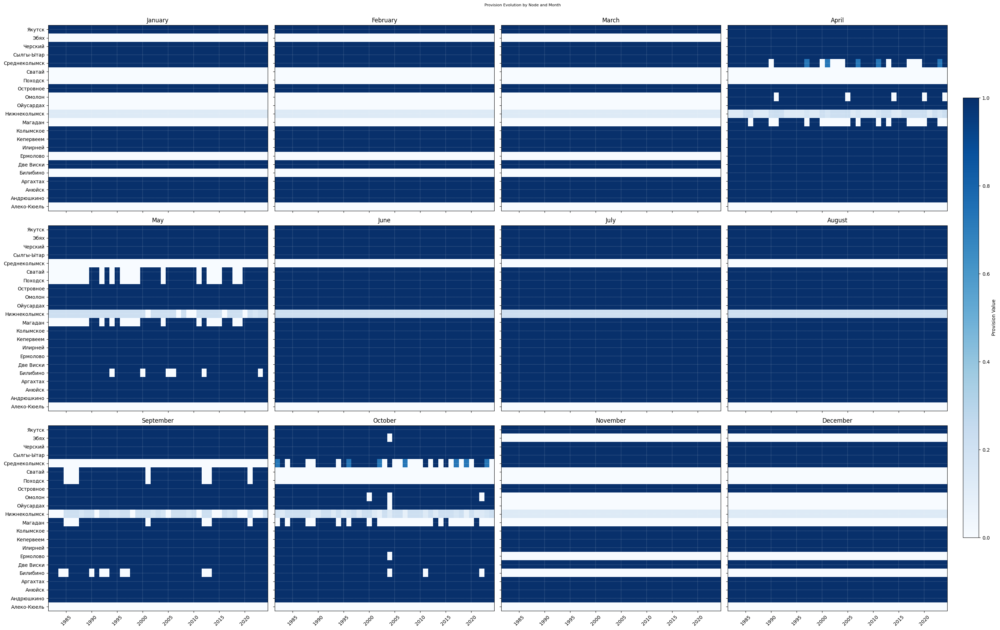

In [69]:
import matplotlib.pyplot as plt
import numpy as np


def plot_provision_evolution_by_node(results, start_year=2025, figsize=(30, 18)):
    """
    Plot provision changes over time for each node, separated by month.

    Parameters:
        results: List of DataFrames (one per timestep) with columns ['name', 'provision']
        start_year: Year of first timestep
        figsize: Size of entire plot grid
    """
    # Сбор имён нод
    node_names = sorted(
        {
            row["name"]
            for timestep in results
            for _, row in timestep.reset_index().iterrows()
        }
    )

    # Организация по месяцам
    monthly_data = {month: {name: [] for name in node_names} for month in range(12)}

    for i, timestep in enumerate(results):
        month = i % 12
        for _, row in timestep.reset_index().iterrows():
            monthly_data[month][row["name"]].append(row["provision"])

    # Сетка 3x4
    fig, axes = plt.subplots(3, 4, figsize=figsize)
    month_names = [
        "January",
        "February",
        "March",
        "April",
        "May",
        "June",
        "July",
        "August",
        "September",
        "October",
        "November",
        "December",
    ]

    for month in range(12):
        ax = axes[month // 4, month % 4]
        data = monthly_data[month]

        # Определяем число лет
        n_years = len(next(iter(data.values()), []))
        if n_years == 0:
            continue  # пропускаем пустые

        years = list(range(start_year, start_year + n_years))
        provision_matrix = np.array([data[node] for node in node_names])

        im = ax.imshow(
            provision_matrix,
            aspect="auto",
            cmap="Blues",
            extent=[years[0] - 0.5, years[-1] + 0.5, -0.5, len(node_names) - 0.5],
            vmin=0,
            vmax=1,
        )

        ax.set_title(month_names[month])
        ax.set_yticks(range(len(node_names)))
        ax.set_yticklabels(node_names if month % 4 == 0 else [])
        ax.tick_params(axis="x", rotation=45)

        if month < 8:
            ax.set_xticklabels([])

        ax.grid(True, which="major", color="w", linestyle="--", linewidth=0.2)

    # Цветовая шкала
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
    fig.colorbar(im, cax=cbar_ax, label="Provision Value")

    fig.suptitle("Provision Evolution by Node and Month", fontsize=8, y=1)
    plt.tight_layout(rect=[0, 0, 0.91, 1])
    plt.show()


# Call the function with the results
plot_provision_evolution_by_node(net.stats.results, 1982)


In [62]:
# net.stats.results[0]

In [ ]:
df_stats


,idx,mean,min,max,median
0,0,1.00,1.0,1.0,1.0
1,1,0.89,0.0,1.0,1.0
2,2,0.89,0.0,1.0,1.0
3,3,0.61,0.0,1.0,1.0
4,4,0.82,0.0,1.0,1.0
...,...,...,...,...,...
511,511,1.00,1.0,1.0,1.0
512,512,1.00,1.0,1.0,1.0
513,513,0.68,0.0,1.0,1.0
514,514,0.59,0.0,1.0,1.0


In [ ]:
# import joypy


# # Add Year column if not already present
# try:
#     df_stats["Year"] = 1982 + df_stats.index // 12
# except Exception:
#     pass

# step = 6
# col = "mean"

# # фильтр по годам, кратным step
# df_joy = df_stats[df_stats["Year"] % step == 0][["Year", col]]
# # plt.figure(figsize=(10, 18))
# joypy.joyplot(
#     df_joy,
#     by="Year",
#     column=col,
#     colormap=plt.cm.viridis,
#     fade=True,
#     # hist=True,
#     linewidth=1.5,
#     overlap=0.1,
#     bins=12,
#     x_range=(0.0, 1.01),
#     figsize=(6, 4),
# )
# plt.title(f"Ridgeline Plot of Provision Metric (Every {step}rd Year)")
# plt.xlabel("Provision Metric")
# plt.show()


In [ ]:
# q_stats = df_stats.groupby("Year")["metric"].quantile([0.25, 0.5, 0.75]).unstack()
# q_stats.columns = ["Q1", "Median", "Q3"]

# plt.plot(q_stats.index, q_stats["Q1"], label="Q1", linestyle="--")
# plt.plot(q_stats.index, q_stats["Median"], label="Median", linewidth=2)
# plt.plot(q_stats.index, q_stats["Q3"], label="Q3", linestyle="--")
# plt.fill_between(q_stats.index, q_stats["Q1"], q_stats["Q3"], alpha=0.2)
# plt.legend()
# plt.title("Provision Metric Quartile Trends")
# plt.xlabel("Year")
# plt.ylabel("Provision Metric")
# plt.grid(True)
# plt.tight_layout()
# plt.show()


In [70]:
# Предполагаем что индекс df_stats — это месяцы в виде `i` (0...len-1)
try:
    df_stats["Month"] = df_stats.index % 12 + 1
    df_stats["Year"] = 1982 + df_stats.index // 12
except Exception:
    pass


In [ ]:
# # 1. Задаём правильный порядок месяцев
# month_order = [
#     "Jan",
#     "Feb",
#     "Mar",
#     "Apr",
#     "May",
#     "Jun",
#     "Jul",
#     "Aug",
#     "Sep",
#     "Oct",
#     "Nov",
#     "Dec",
# ]

# # 2. Преобразуем колонку Month_Name в категориальный тип с порядком
# df_stats["Month_Name"] = df_stats["Month"].apply(
#     lambda x: month_order[x - 1] if 1 <= x <= 12 else "Unknown"
# )
# df_stats["Month_Name"] = pd.Categorical(
#     df_stats["Month_Name"], categories=month_order, ordered=True
# )

# # 3. Делаем pivot с уже упорядоченными месяцами
# pivot = (
#     df_stats.sort_index()
#     .pivot_table(index="Year", columns="Month_Name", values="min")
#     .T
# )

# # 4. Отрисовка
# import seaborn as sns
# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(14, 4))


# sns.heatmap(
#     pivot,
#     annot=False,
#     cmap="Blues",
#     linewidths=0,
#     linecolor="white",  # или слегка серый: '#f8f8f8'
#     ax=ax,
#     vmin=0,
# )

# # ax.set_facecolor("none")  # внутренняя область — прозрачная
# # fig.patch.set_alpha(0.0)  # внешняя область — прозрачная
# plt.title("Min provision metric across all settlements")
# plt.show()


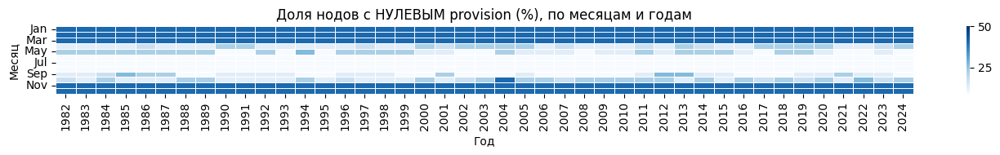

In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


def count_provision_zero_nonzero(results, start_year=1982):
    records = []

    for i, df in enumerate(results):
        year = start_year + (i // 12)
        month = (i % 12) + 1  # 1-12

        for _, row in df.reset_index().iterrows():
            records.append(
                {
                    "year": year,
                    "month": month,
                    "name": row["name"],
                    "provision": row["provision"],
                }
            )

    df_all = pd.DataFrame(records)
    df_all["is_non_zero"] = df_all["provision"] != 0
    df_all["month_name"] = pd.to_datetime(df_all["month"], format="%m").dt.strftime(
        "%b"
    )

    # Группировка
    counts = (
        df_all.groupby(["year", "month_name"])["is_non_zero"]
        .agg(non_zero="sum", total="count")
        .reset_index()
    )
    counts["zero"] = counts["total"] - counts["non_zero"]
    counts["zero_pct"] = 100 * counts["zero"] / counts["total"]

    # Упорядочим месяцы
    month_order = [
        "Jan",
        "Feb",
        "Mar",
        "Apr",
        "May",
        "Jun",
        "Jul",
        "Aug",
        "Sep",
        "Oct",
        "Nov",
        "Dec",
    ]
    counts["month_name"] = pd.Categorical(
        counts["month_name"], categories=month_order, ordered=True
    )

    return counts


counts = count_provision_zero_nonzero(net.stats.results, start_year=1982)

# pivot_zero = counts.pivot(index="month_name", columns="year", values="zero")
pivot_zero_pct = counts.pivot(index="month_name", columns="year", values="zero_pct")

plt.figure(figsize=(14, 2))
sns.heatmap(
    pivot_zero_pct, cmap="Blues", linewidths=0.5, annot=False, fmt=".1f", vmax=50
)

plt.title("Доля нодов с НУЛЕВЫМ provision (%), по месяцам и годам")
plt.xlabel("Год")
plt.ylabel("Месяц")
plt.tight_layout()
plt.show()


In [ ]:
# plt.figure(figsize=(14, 6))
# sns.heatmap(pivot_zero, cmap="Blues", linewidths=0.5)
# plt.title("Кол-во поселений с НУЛЕВЫМ значением метрики по месяцам и годам")
# plt.xlabel("Год")
# plt.ylabel("Месяц")
# plt.tight_layout()
# plt.show()


In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Пороговые температуры
thresholds = {
    "plane": -44.6,
    "winter_tr": -11.2,
    "water_ship": 0.3,
    "car_warm": 7.3,
}

# Извлекаем размер времени
sample_node = list(G_undirected.nodes(data=True))[0]
T = sample_node[1]["temperature"].shape[0]
n_years = T // 12
years = list(range(1982, 1982 + n_years))
months = list(range(1, 13))

records = []

for t in range(T):
    year = 1982 + (t // 12)
    month = (t % 12) + 1

    # Счётчики по каждому режиму
    mode_counts = {mode: 0 for mode in thresholds}

    for _, data in G_undirected.nodes(data=True):
        temp = data["temperature"].values[t]
        for mode, thresh in thresholds.items():
            if mode == "winter_tr" and temp < thresh:
                mode_counts[mode] += 1
            elif mode != "winter_tr" and temp > thresh:
                mode_counts[mode] += 1

    # Сохраняем
    for mode in thresholds:
        records.append(
            {
                "year": year,
                "month": month,
                "month_name": pd.to_datetime(str(month), format="%m").strftime("%b"),
                "mode": mode,
                "count": mode_counts[mode],
            }
        )

df_modes_monthly = pd.DataFrame(records)


In [73]:
df_modes_monthly


,year,month,month_name,mode,count
0,1982,1,Jan,plane,22
1,1982,1,Jan,winter_tr,22
2,1982,1,Jan,water_ship,0
3,1982,1,Jan,car_warm,0
4,1982,2,Feb,plane,22
...,...,...,...,...,...
2059,2024,11,Nov,car_warm,0
2060,2024,12,Dec,plane,22
2061,2024,12,Dec,winter_tr,21
2062,2024,12,Dec,water_ship,0


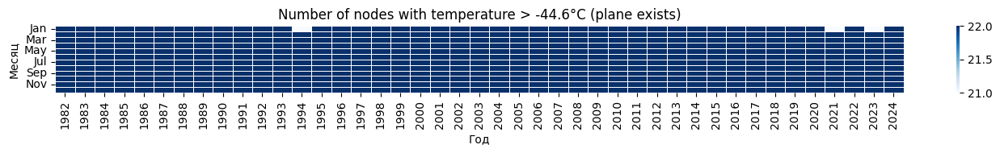

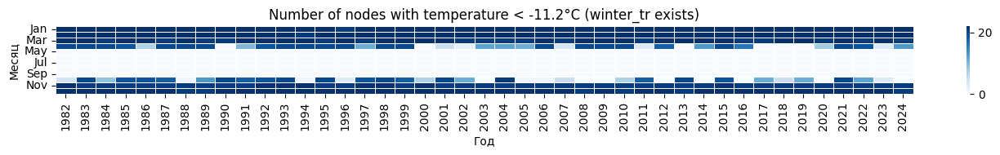

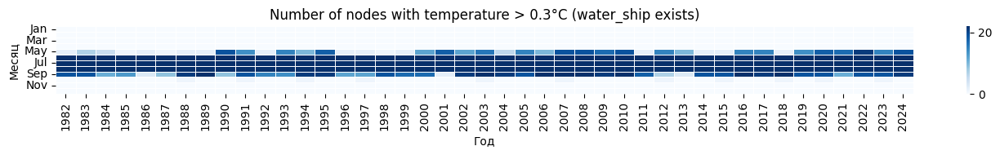

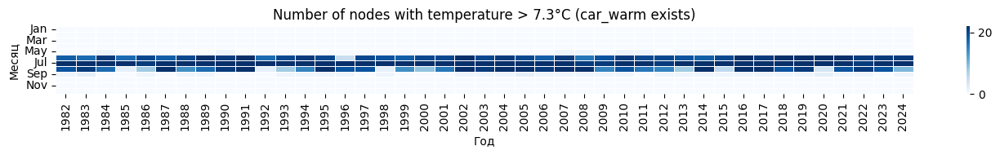

In [74]:
# Упорядочим месяцы
month_order = [
    "Jan",
    "Feb",
    "Mar",
    "Apr",
    "May",
    "Jun",
    "Jul",
    "Aug",
    "Sep",
    "Oct",
    "Nov",
    "Dec",
]
df_modes_monthly["month_name"] = pd.Categorical(
    df_modes_monthly["month_name"], categories=month_order, ordered=True
)

# Фильтр по одному режиму
# mode = "car_warm"

for mode in thresholds:
    df_mode = df_modes_monthly[df_modes_monthly["mode"] == mode]
    pivot = df_mode.pivot(index="month_name", columns="year", values="count")

    plt.figure(figsize=(14, 2))
    sns.heatmap(
        pivot,
        cmap="Blues",
        linewidths=0.5,
    )

    sign = ">" if mode != "winter_tr" else "<"

    plt.title(
        f"Number of nodes with temperature {sign} {thresholds[mode]}°C ({mode} exists)"
    )
    plt.xlabel("Год")
    plt.ylabel("Месяц")
    plt.tight_layout()
    plt.show()


In [ ]:
"""
Гистограммы распределения времени по ребрам
 + относительно норматива по времени (для сервиса)
"""


'\nГистограммы распределения времени по ребрам\n + относительно норматива по времени (для сервиса)\n'

In [ ]:
"""
Хочется (однозначно) понять
как пропадают линки от температуры
Всм не картой сети а графиком
Где скажем есть какая-то температура например для ноды (в течение года(?))
И на ней же отмечено когда существует тип транспорта (или любой, или для этой ноды)
"""


'\nХочется (однозначно) понять\nкак пропадают линки от температуры\nВсм не картой сети а графиком\nГде скажем есть какая-то температура например для ноды (в течение года(?))\nИ на ней же отмечено когда существует тип транспорта (или любой, или для этой ноды)\n'

In [ ]:
"""
Хочется показать (при рассм одного сервиса)
Какие линки появляются *иногда* в зависимости от изменения температуры
Или наоборот исчезают (?)
"""


'\nХочется показать (при рассм одного сервиса)\nКакие линки появляются *иногда* в зависимости от изменения температуры\nИли наоборот исчезают (?)\n'

In [79]:
net.stats.graphs[0].edges(data=True)

OutEdgeDataView([('Алеко-Кюель', 'Билибино', {'weight': 2194.0, 'label': 'winter_tr', 'temperature': np.int64(-33), 'transport_probability': np.float64(1.0)}), ('Алеко-Кюель', 'Сватай', {'weight': 264.0, 'label': 'winter_tr', 'temperature': np.int64(-40), 'transport_probability': np.float64(1.0)}), ('Алеко-Кюель', 'Андрюшкино', {'weight': 780.0, 'label': 'winter_tr', 'temperature': np.int64(-39), 'transport_probability': np.float64(1.0)}), ('Алеко-Кюель', 'Анюйск', {'weight': 1721.0, 'label': 'winter_tr', 'temperature': np.int64(-38), 'transport_probability': np.float64(1.0)}), ('Алеко-Кюель', 'Аргахтах', {'weight': 567.0, 'label': 'winter_tr', 'temperature': np.int64(-40), 'transport_probability': np.float64(1.0)}), ('Алеко-Кюель', 'Илирней', {'weight': 2618.0, 'label': 'winter_tr', 'temperature': np.int64(-31), 'transport_probability': np.float64(1.0)}), ('Алеко-Кюель', 'Кепервеем', {'weight': 2258.0, 'label': 'winter_tr', 'temperature': np.int64(-33), 'transport_probability': np.flo

In [ ]:
for u, v, data in net.stats.graphs[0].edges(data=True):
    print(data.get("is_service_flow"))

{'weight': 2194.0, 'label': 'winter_tr', 'temperature': np.int64(-33), 'transport_probability': np.float64(1.0)}
{'weight': 264.0, 'label': 'winter_tr', 'temperature': np.int64(-40), 'transport_probability': np.float64(1.0)}
{'weight': 780.0, 'label': 'winter_tr', 'temperature': np.int64(-39), 'transport_probability': np.float64(1.0)}
{'weight': 1721.0, 'label': 'winter_tr', 'temperature': np.int64(-38), 'transport_probability': np.float64(1.0)}
{'weight': 567.0, 'label': 'winter_tr', 'temperature': np.int64(-40), 'transport_probability': np.float64(1.0)}
{'weight': 2618.0, 'label': 'winter_tr', 'temperature': np.int64(-31), 'transport_probability': np.float64(1.0)}
{'weight': 2258.0, 'label': 'winter_tr', 'temperature': np.int64(-33), 'transport_probability': np.float64(1.0)}
{'weight': 1264.0, 'label': 'winter_tr', 'temperature': np.int64(-39), 'transport_probability': np.float64(1.0)}
{'weight': 1626.0, 'label': 'winter_tr', 'temperature': np.int64(-39), 'transport_probability': np.

In [75]:
net.stats.graphs[0].nodes(data=True)

NodeDataView({'Алеко-Кюель': {'id': 0, 'name': 'Алеко-Кюель', 'geometry': <POLYGON ((58505505.484 7829190.457, 58505500.669 7829092.44, 58505486.27 78...>, 'x': 58504505.484264225, 'y': 7829190.4574392, 'population': 512, 'epsg': 2693, 'capacity_hospital': 500, 'temperature':      temperature
0            -40
1            -33
2            -26
3            -14
4             -5
..           ...
511            9
512            3
513           -9
514          -26
515          -24

[516 rows x 1 columns], 'provision': np.float64(1.0), 'demand_within': np.float64(62.0), 'demand_without': np.float64(0.0), 'capacity_left': np.float64(0.0)}, 'Билибино': {'id': 5, 'name': 'Билибино', 'geometry': <POLYGON ((59062296.508 7589776.239, 59062291.693 7589678.222, 59062277.294 ...>, 'x': 59061296.50836069, 'y': 7589776.239477613, 'population': 5449, 'epsg': 2693, 'capacity_hospital': 0, 'temperature':      temperature
0            -33
1            -24
2            -25
3            -16
4             -7


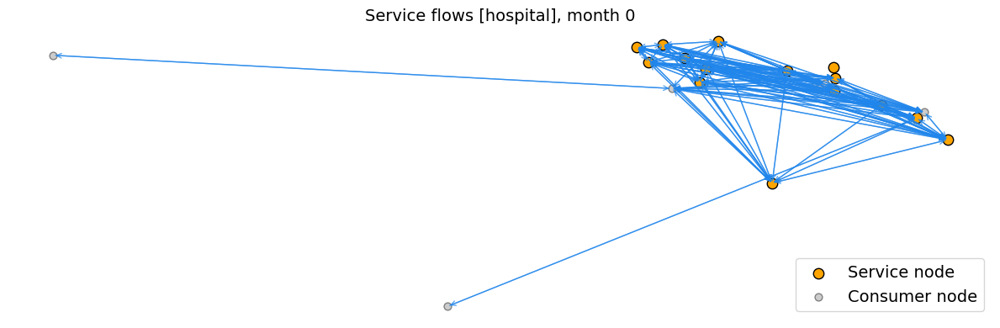

In [83]:
import matplotlib.pyplot as plt
import networkx as nx


def plot_service_flows_for_month(
    G, month_idx, capacity_field="capacity_hospital", figsize=(12, 8), title=""
):
    pos = {n: (d["x"], d["y"]) for n, d in G.nodes(data=True)}

    # 1. Все сервисные ноды (capacity > 0)
    service_nodes = [n for n, d in G.nodes(data=True) if d.get(capacity_field, 0) > 0]
    # 2. Остальные — потребители
    consumer_nodes = [n for n in G.nodes() if n not in service_nodes]

    fig, ax = plt.subplots(figsize=figsize)

    # Рисуем ноды
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=service_nodes,
        node_color="orange",
        edgecolors="black",
        node_size=figsize[1] * 20,
        ax=ax,
        label="Service node",
    )
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=consumer_nodes,
        node_color="#cccccc",
        edgecolors="gray",
        node_size=figsize[1] * 10,
        ax=ax,
        label="Consumer node",
    )

    for u, v, data in G.edges(data=True):
        if data.get("transport_probability", 0) > 0:
        # if data.get("is_service_flow", False):
            ax.annotate(
                "",
                xy=pos[v],
                xycoords="data",
                xytext=pos[u],
                textcoords="data",
                arrowprops=dict(
                    arrowstyle="->", lw=figsize[1] / 4, color="#2186eb", alpha=0.72
                ),
                zorder=3,
            )

    ax.set_title(title, fontsize=14)
    ax.axis("off")
    ax.legend(loc="lower right", fontsize=14)
    plt.tight_layout()
    plt.show()


month_idx = 0
# Пример вызова для нужного месяца (граф берём из твоего net)
plot_service_flows_for_month(
    net.stats.graphs[month_idx],
    month_idx=month_idx,
    figsize=(12, 4),
    title=f"Service flows [{SERVICE_NAME}], month {month_idx}",
)


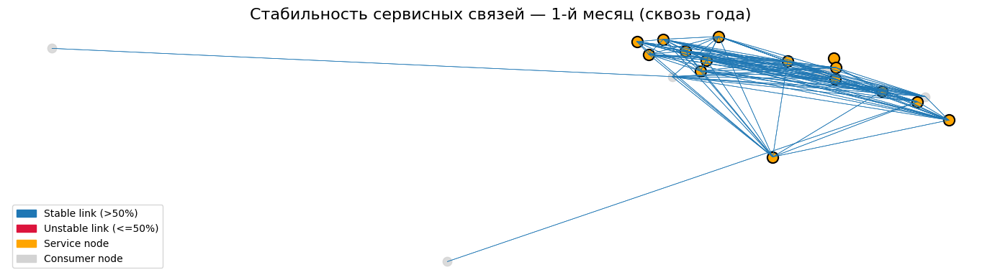

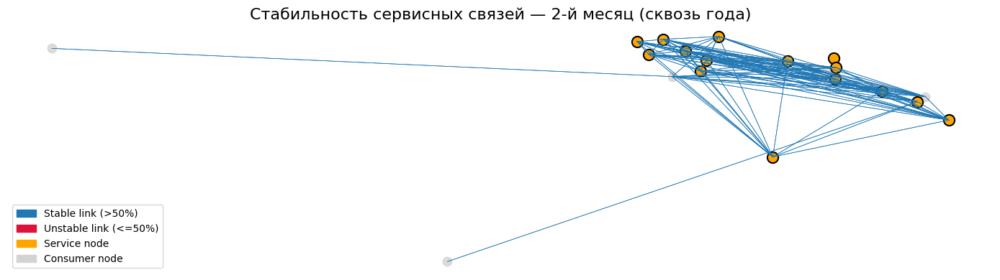

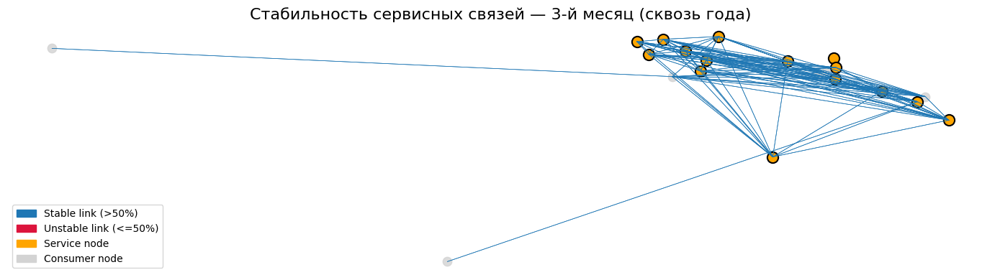

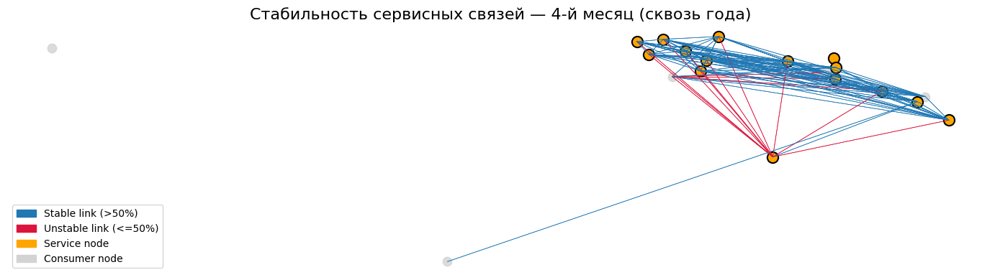

Edge ('Алеко-Кюель', 'Омолон') appeared in years: [1982, 1983, 1984, 1987, 1988, 1989, 1993, 1994, 1995, 1996, 1998, 1999, 2006, 2008, 2009, 2010, 2015, 2021]
Edge ('Сватай', 'Омолон') appeared in years: [1982, 1983, 1984, 1987, 1988, 1989, 1993, 1994, 1995, 1996, 1998, 1999, 2006, 2008, 2009, 2010, 2015, 2021]
Edge ('Андрюшкино', 'Омолон') appeared in years: [1982, 1983, 1984, 1987, 1988, 1989, 1993, 1994, 1995, 1996, 1998, 1999, 2006, 2008, 2009, 2010, 2014, 2015, 2021]
Edge ('Аргахтах', 'Омолон') appeared in years: [1982, 1983, 1984, 1987, 1988, 1989, 1993, 1994, 1995, 1996, 1998, 1999, 2006, 2008, 2009, 2010, 2015, 2021]
Edge ('Ойусардах', 'Омолон') appeared in years: [1982, 1983, 1984, 1987, 1988, 1989, 1993, 1994, 1995, 1996, 1998, 1999, 2006, 2008, 2009, 2010, 2015, 2021]
Edge ('Среднеколымск', 'Анюйск') appeared in years: [1982, 1983, 1984, 1985, 1987, 1988, 1989, 1992, 1993, 1994, 1995, 1996, 1998, 1999, 2006, 2008, 2009, 2010, 2015, 2021, 2022]
Edge ('Среднеколымск', 'Нижнеко

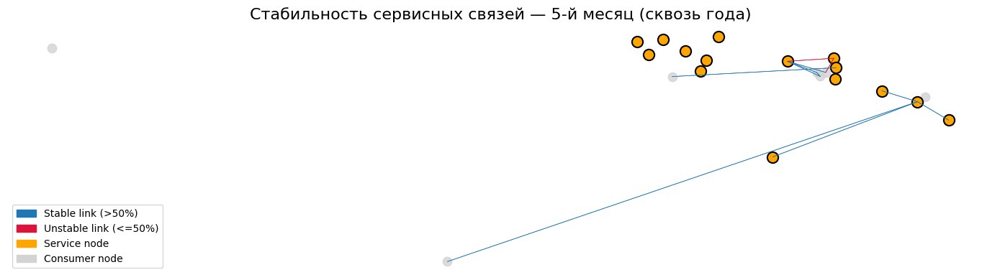

Edge ('Колымское', 'Походск') appeared in years: [1990, 1993, 1995, 2001, 2002, 2003, 2007, 2008, 2009, 2010, 2016, 2017, 2020, 2021, 2022, 2024]
Edge ('Нижнеколымск', 'Походск') appeared in years: [1990, 1993, 1995, 2001, 2002, 2003, 2007, 2008, 2009, 2010, 2016, 2017, 2020, 2021, 2022, 2024]
Edge ('Походск', 'Колымское') appeared in years: [1990, 1993, 1995, 2001, 2002, 2003, 2007, 2008, 2009, 2010, 2016, 2017, 2020, 2021, 2022, 2024]
Edge ('Походск', 'Нижнеколымск') appeared in years: [1990, 1993, 1995, 2001, 2002, 2003, 2007, 2008, 2009, 2010, 2016, 2017, 2020, 2021, 2022, 2024]


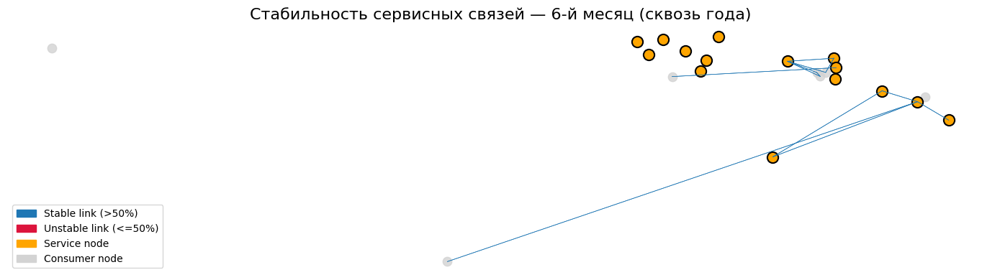

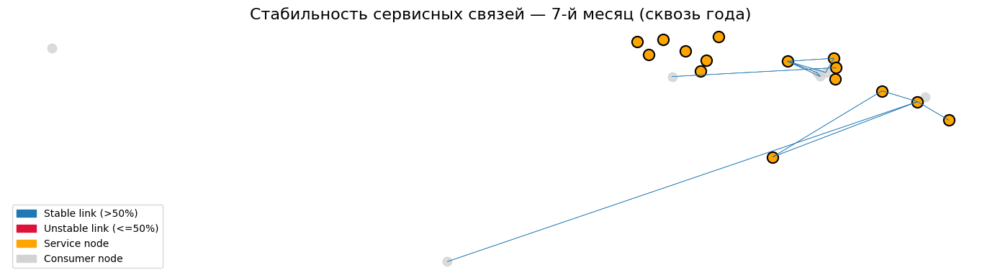

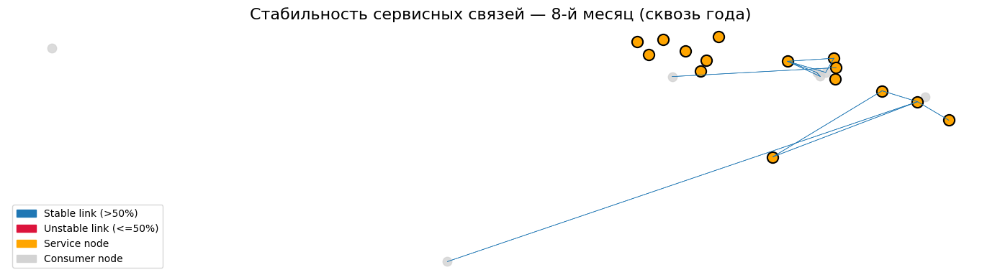

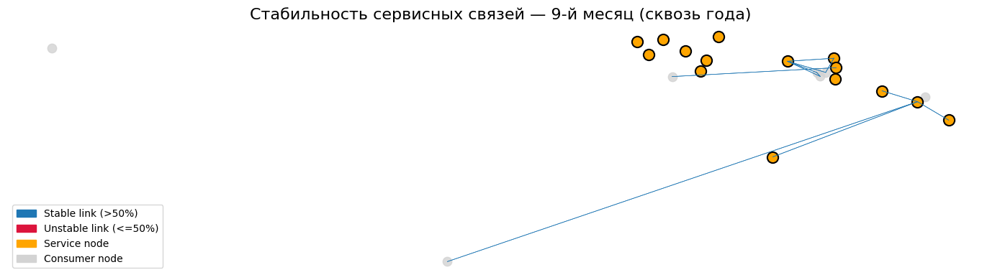

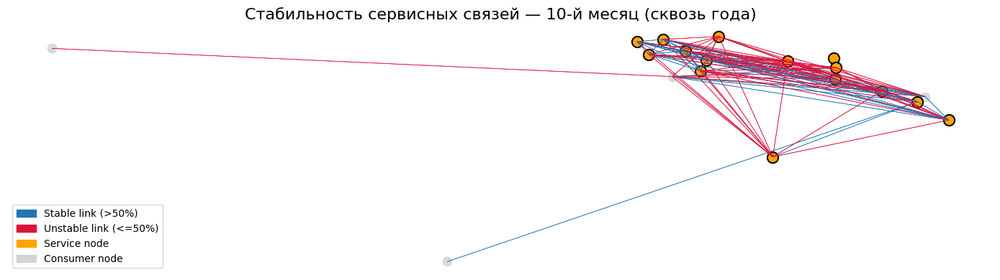

Edge ('Алеко-Кюель', 'Андрюшкино') appeared in years: [1983, 1984, 1985, 1986, 1987, 1989, 1990, 1991, 1992, 1993, 1995, 1997, 1998, 1999, 2001, 2002, 2004, 2013, 2015, 2017, 2021]
Edge ('Алеко-Кюель', 'Анюйск') appeared in years: [1983, 1985, 1986, 1987, 1990, 1991, 1992, 1993, 1995, 1997, 1998, 1999, 2001, 2004, 2011, 2013, 2015, 2021]
Edge ('Алеко-Кюель', 'Колымское') appeared in years: [1983, 1985, 1986, 1987, 1989, 1990, 1991, 1992, 1993, 1995, 1997, 1998, 1999, 2001, 2004, 2013, 2015, 2021]
Edge ('Алеко-Кюель', 'Нижнеколымск') appeared in years: [1983, 1985, 1986, 1987, 1990, 1991, 1992, 1993, 1995, 1997, 1998, 1999, 2001, 2004, 2011, 2013, 2015, 2021]
Edge ('Алеко-Кюель', 'Омолон') appeared in years: [1983, 1989, 1990, 1993, 1995, 1998, 2001, 2002, 2004, 2010, 2011, 2013, 2019, 2021]
Edge ('Алеко-Кюель', 'Островное') appeared in years: [1983, 1985, 1986, 1990, 1992, 1993, 1995, 1997, 1998, 1999, 2001, 2002, 2004, 2011, 2013, 2015, 2019, 2021]
Edge ('Билибино', 'Андрюшкино') appe

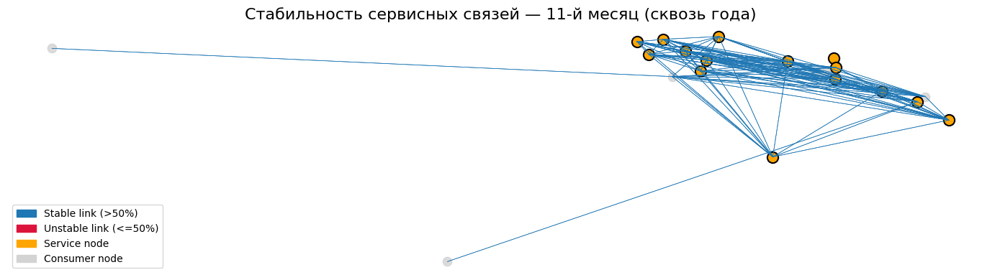

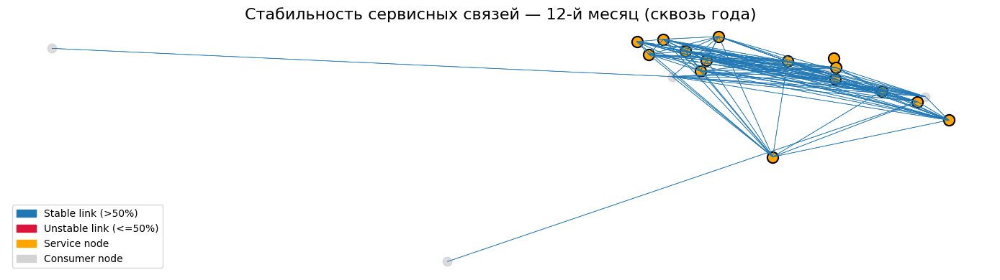

In [88]:
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import networkx as nx


def edge_stability_over_years(
    net, month_idx, service_name="hospital", figsize=(14, 4), freq=0.9
):
    # 1. Соберём все графы этого месяца сквозь года
    graphs = [net.stats.graphs[i] for i in range(month_idx, len(net.stats.graphs), 12)]
    years = [1982 + i for i in range(len(graphs))]

    # 2. Собираем частоты появления каждого сервисного ребра
    edge_count = Counter()
    edge_years = defaultdict(list)
    for G, year in zip(graphs, years):
        for u, v, data in G.edges(data=True):
            if data.get("transport_probability", 0) > 0:
            # if data.get("is_service_flow", False):  # ⬅️ фильтрация!
                edge_count[(u, v)] += 1
                edge_years[(u, v)].append(year)

    n_years = len(graphs)
    # 3. Рассчитываем частоты (от 0 до 1)
    edge_freq = {edge: count / n_years for edge, count in edge_count.items()}

    # 4. Визуализация среднего графа
    all_nodes = set()
    for G in graphs:
        all_nodes.update(G.nodes)
    pos = {node: (G.nodes[node]["x"], G.nodes[node]["y"]) for node in all_nodes}

    fig, ax = plt.subplots(figsize=figsize)

    service_nodes = [
        n
        for n in all_nodes
        if any(G.nodes[n].get(f"capacity_{service_name}", 0) > 0 for G in graphs)
    ]
    consumer_nodes = list(set(all_nodes) - set(service_nodes))

    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=consumer_nodes,
        node_color="lightgray",
        node_size=80,
        alpha=0.8,
        ax=ax,
    )
    nx.draw_networkx_nodes(
        G,
        pos,
        nodelist=service_nodes,
        node_color="orange",
        node_size=120,
        edgecolors="black",
        linewidths=1.5,
        ax=ax,
    )

    for (u, v), f in edge_freq.items():
        color = "tab:blue" if f > freq else "crimson"
        ax.plot(
            [pos[u][0], pos[v][0]],
            [pos[u][1], pos[v][1]],
            color=color,
            linewidth=0.5,
        )

    import matplotlib.patches as mpatches

    ax.legend(
        handles=[
            mpatches.Patch(color="tab:blue", label=f"Stable link (>{100*freq:.0f}%)"),
            mpatches.Patch(color="crimson", label=f"Unstable link (<={100*freq:.0f}%)"),
            mpatches.Patch(color="orange", label="Service node"),
            mpatches.Patch(color="lightgray", label="Consumer node"),
        ],
        loc="lower left",
    )

    ax.set_title(
        f"Стабильность сервисных связей — {month_idx+1}-й месяц (сквозь года)",
        fontsize=16,
    )
    ax.axis("off")
    plt.tight_layout()
    plt.show()

    # Возвращаем нестабильные рёбра (по сервисному потоку)
    rare_edges = {
        edge: sorted(edge_years[edge]) for edge, f in edge_freq.items() if f <= freq
    }

    return rare_edges, edge_years


for m in range(12):
    rare_links, edge_years = edge_stability_over_years(net, month_idx=m, freq=0.5)
    for edge, years in rare_links.items():
        print(f"Edge {edge} appeared in years: {years}")


In [ ]:
net.stats.records


,idx,mean,min,max,median,Month,Year
0,0,1.00,1.0,1.0,1.0,1,1982
1,1,0.89,0.0,1.0,1.0,2,1982
2,2,0.89,0.0,1.0,1.0,3,1982
3,3,0.61,0.0,1.0,1.0,4,1982
4,4,0.82,0.0,1.0,1.0,5,1982
...,...,...,...,...,...,...,...
511,511,1.00,1.0,1.0,1.0,8,2024
512,512,1.00,1.0,1.0,1.0,9,2024
513,513,0.68,0.0,1.0,1.0,10,2024
514,514,0.59,0.0,1.0,1.0,11,2024


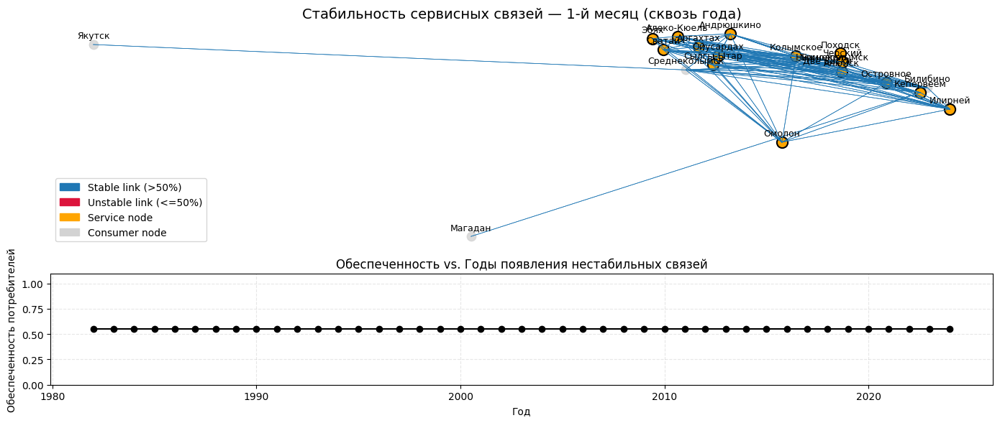

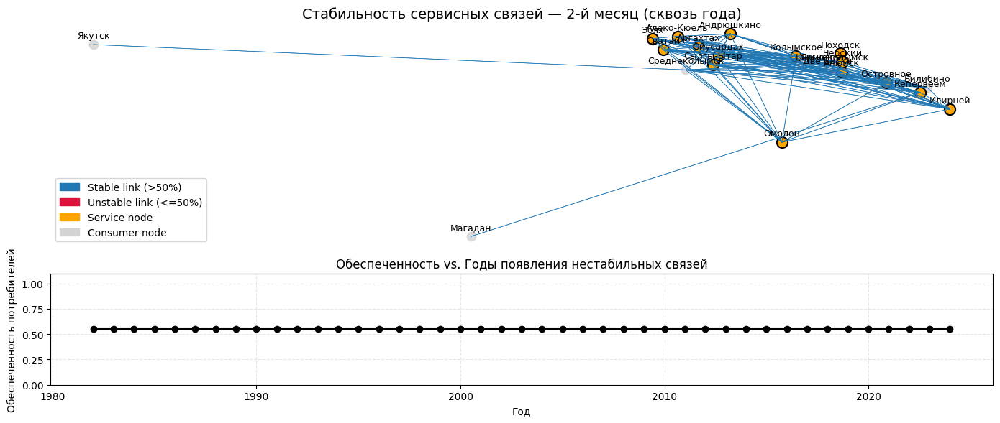

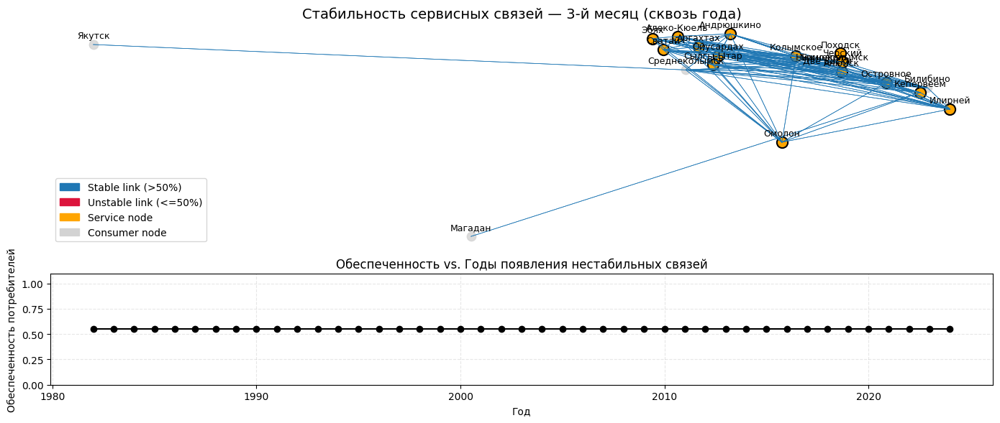

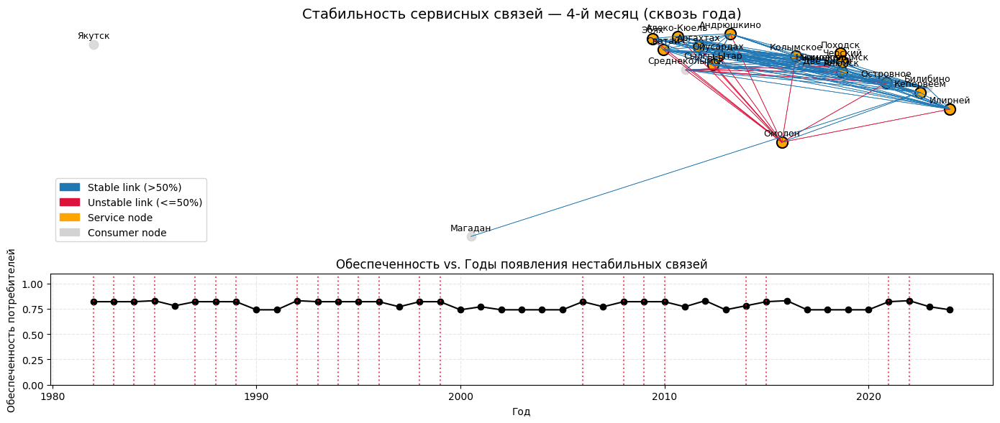

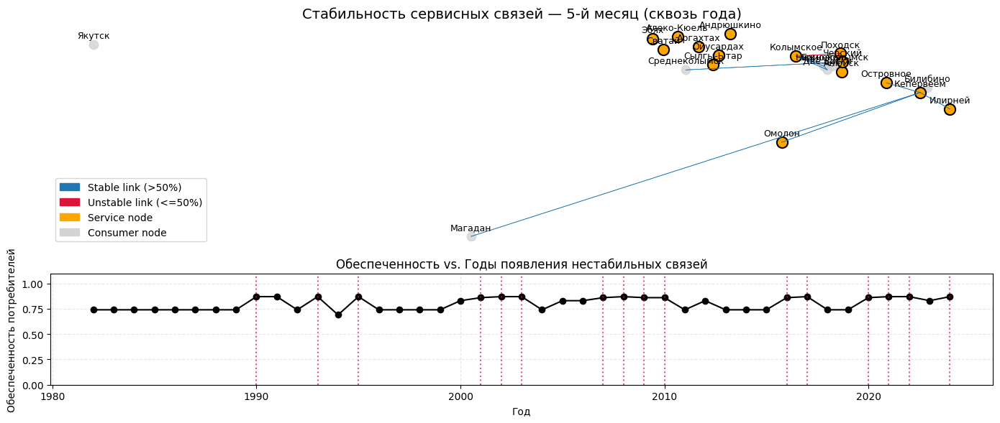

...

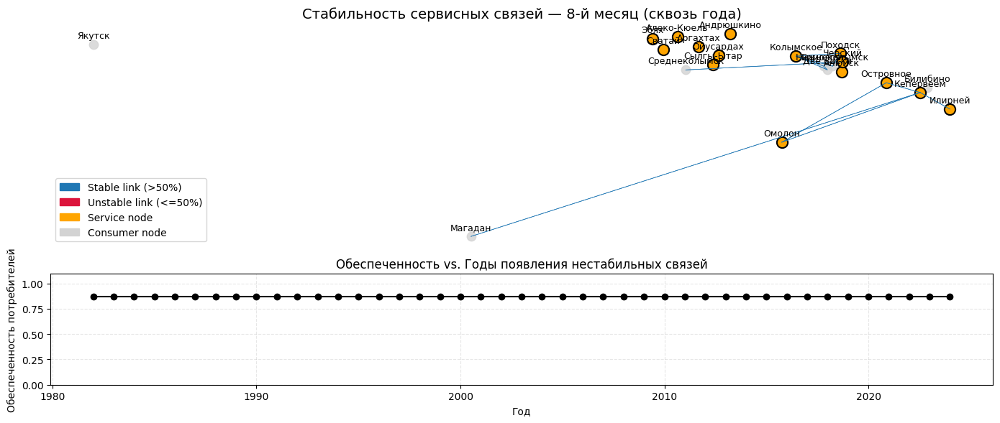

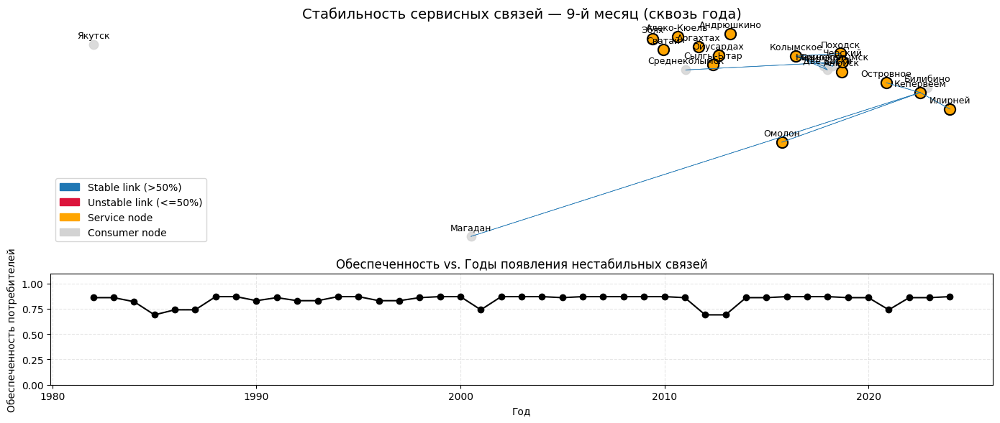

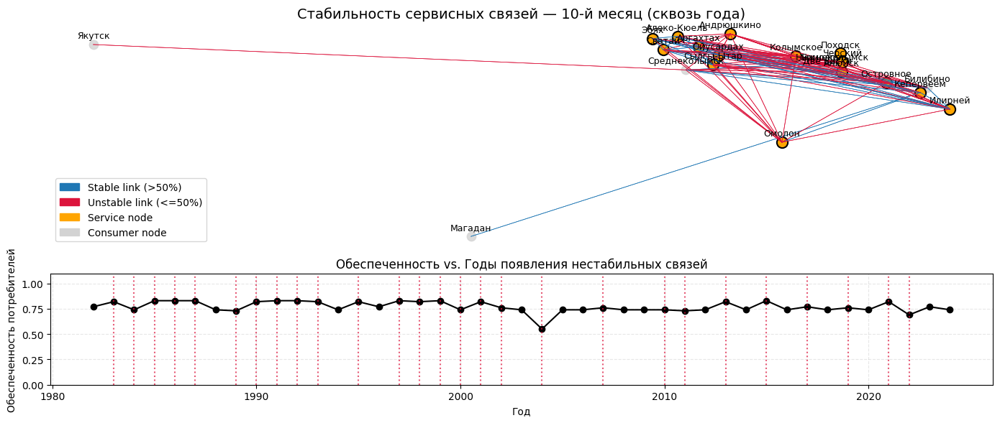

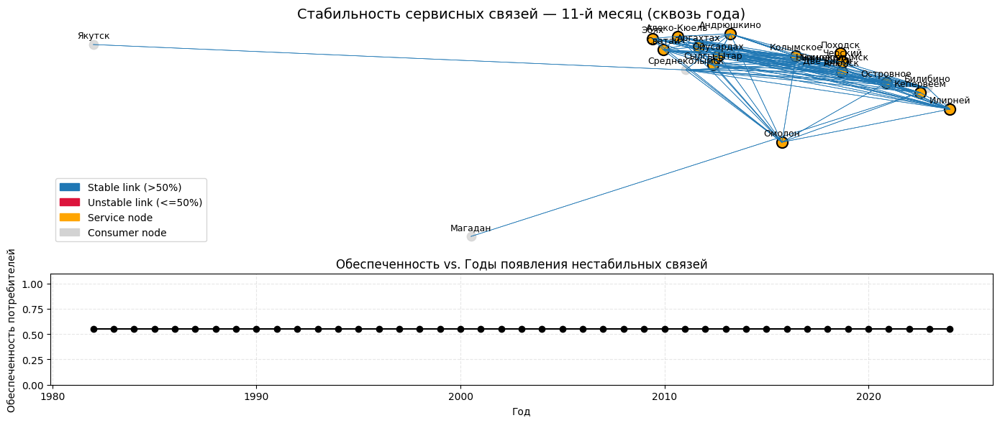

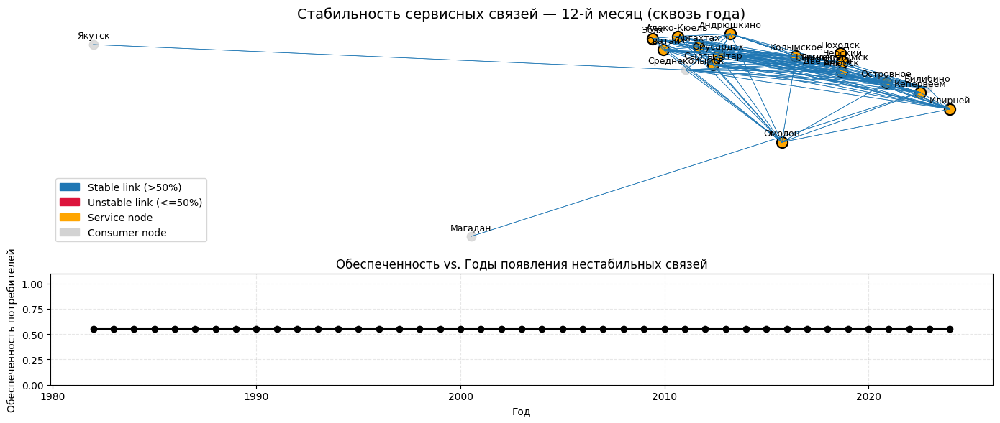

In [97]:
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import networkx as nx


def edge_stability_over_years(
    net, month_idx, service_name="hospital", figsize=(14, 6), freq=0.1
):
    graphs = [net.stats.graphs[i] for i in range(month_idx, len(net.stats.graphs), 12)]
    years = [1982 + i for i in range(len(graphs))]

    edge_count = Counter()
    edge_years = defaultdict(list)
    for G, year in zip(graphs, years):
        for u, v, data in G.edges(data=True):
            # if data.get("is_service_flow", False):
            if data.get("transport_probability", 0) > 0:
                edge_count[(u, v)] += 1
                edge_years[(u, v)].append(year)

    n_years = len(graphs)
    edge_freq = {edge: count / n_years for edge, count in edge_count.items()}
    rare_edges = {
        edge: sorted(edge_years[edge]) for edge, f in edge_freq.items() if f <= freq
    }

    # Соберём список годов, где есть хотя бы одно редкое ребро
    years_with_rare = sorted({y for years in rare_edges.values() for y in years})
    # years_without_rare = [y for y in years if y not in years_with_rare]

    def compute_provision(G, service_name):
        consumers = [
            n
            for n, d in G.nodes(data=True)
            if d.get(f"capacity_{service_name}", 0) == 0
        ]
        prov_values = [
            G.nodes[n].get(f"provision_{service_name}", 0.0) for n in consumers
        ]
        if not prov_values:
            return 0.0
        return sum(prov_values) / len(prov_values)

    provision_series = (
        net.stats.records.query(f"Month == {month_idx+1}")
        .set_index("Year")["mean"]
        .to_dict()
    )

    # ─────── 📌 Визуализация ─────── #
    all_nodes = set()
    for G in graphs:
        all_nodes.update(G.nodes)
    pos = {node: (G.nodes[node]["x"], G.nodes[node]["y"]) for node in all_nodes}

    fig, (ax_net, ax_plot) = plt.subplots(
        2, 1, figsize=figsize, gridspec_kw={"height_ratios": [2, 1]}
    )

    service_nodes = [
        n
        for n in all_nodes
        if any(G.nodes[n].get(f"capacity_{service_name}", 0) > 0 for G in graphs)
    ]
    consumer_nodes = list(set(all_nodes) - set(service_nodes))

    G0 = graphs[0]  # просто для node атрибутов
    nx.draw_networkx_nodes(
        G0,
        pos,
        nodelist=consumer_nodes,
        node_color="lightgray",
        node_size=80,
        alpha=0.8,
        ax=ax_net,
    )
    nx.draw_networkx_nodes(
        G0,
        pos,
        nodelist=service_nodes,
        node_color="orange",
        node_size=120,
        edgecolors="black",
        linewidths=1.5,
        ax=ax_net,
    )

    for node, (x, y) in pos.items():
        name = G0.nodes[node].get("name", str(node))
        ax_net.text(
            x,
            y + 20000,   # смещение вверх, подбери по масштабу графа
            name,
            fontsize=9,
            ha="center",
            va="bottom",
            zorder=3,
        )

    for (u, v), f in edge_freq.items():
        color = "tab:blue" if f > freq else "crimson"
        ax_net.plot(
            [pos[u][0], pos[v][0]],
            [pos[u][1], pos[v][1]],
            color=color,
            linewidth=0.5,
        )

    import matplotlib.patches as mpatches

    ax_net.legend(
        handles=[
            mpatches.Patch(color="tab:blue", label=f"Stable link (>{100*freq:.0f}%)"),
            mpatches.Patch(color="crimson", label=f"Unstable link (<={100*freq:.0f}%)"),
            mpatches.Patch(color="orange", label="Service node"),
            mpatches.Patch(color="lightgray", label="Consumer node"),
        ],
        loc="lower left",
    )
    ax_net.set_title(
        f"Стабильность сервисных связей — {month_idx+1}-й месяц (сквозь года)",
        fontsize=14,
    )
    ax_net.axis("off")

    # ─────── 📈 График обеспеченности ───────
    ax_plot.plot(
        provision_series.keys(), provision_series.values(), marker="o", color="black"
    )
    ax_plot.set_ylabel("Обеспеченность потребителей")
    ax_plot.set_xlabel("Год")
    ax_plot.set_ylim(0, 1.05)
    ax_plot.grid(True, linestyle="--", alpha=0.3)

    for year in years_with_rare:
        ax_plot.axvline(x=year, color="crimson", linestyle=":", alpha=0.7)

    ax_plot.set_title(
        "Обеспеченность vs. Годы появления нестабильных связей", fontsize=12
    )
    plt.ylim((0.0, 1.1))
    plt.tight_layout()
    plt.show()

    return rare_edges, provision_series


for m in range(12):
    rare_links, provision = edge_stability_over_years(net, month_idx=m, freq=0.5)


# -- Stop here --

In [ ]:
# --------------------------------------------------------------------------------------------------
1 / 0


ZeroDivisionError: division by zero

# Some other experiments with temporal data graph

In [ ]:
# !pip install git+https://github.com/pathpy/pathpyg.git


In [ ]:
# # First install reticula
# # !pip install reticula

# import reticula as ret
# import numpy as np
# import pandas as pd
# from tqdm import tqdm


# def convert_to_reticula(net_stats):
#     import reticula as ret
#     from tqdm import tqdm
#     import networkx as nx

#     # Create a mapping of original node labels to integers
#     all_nodes = set()
#     for g in net_stats.graphs:
#         all_nodes.update(g.nodes())
#     node_mapping = {node: idx for idx, node in enumerate(sorted(all_nodes))}
#     reverse_mapping = {v: k for k, v in node_mapping.items()}

#     # Initialize empty list for temporal edges
#     temporal_edges = []

#     # Iterate through timesteps and add edges
#     for t, g in enumerate(tqdm(net_stats.graphs)):
#         # Relabel nodes using the mapping
#         g = nx.relabel_nodes(g, node_mapping)

#         # Add edges for this timestep with their timestamps
#         for u, v, data in g.edges(data=True):
#             temporal_edges.append((u, v, t))

#     # Create reticula temporal network
#     temp_net = ret.undirected_temporal_network[ret.int64, ret.int64](temporal_edges)

#     # Return network and mappings as a tuple
#     return temp_net, node_mapping, reverse_mapping


# temp_net, node_mapping, reverse_mapping = convert_to_reticula(net.stats)


In [ ]:
# !pip install torch_geometric


In [ ]:
# !pip install torch


In [ ]:
import pathpyG as pp


In [ ]:
def convert_to_pathpy(net_stats):
    """
    Convert NetworkX temporal graphs to pathpyG temporal network

    Args:
        net_stats: NetworkX DynamicGraph container with .graphs attribute

    Returns:
        pathpyG.TemporalGraph object
    """
    from tqdm import tqdm
    import pathpyG as pp

    # Initialize lists for edges and timestamps
    edges = []

    # Collect edges from each timestep
    print("Converting to pathpyG temporal network...")
    for t, g in enumerate(tqdm(net_stats.graphs)):
        t += 1
        for u, v, data in g.edges(data=True):
            # Add edge and timestamp
            edges.append([u, v, t])

            # For undirected network, add reverse edge
            # edges.append([(v, u), t])

    print(np.array(edges))

    # Create temporal graph
    t_net = pp.TemporalGraph.from_edge_list(
        edge_list=edges,
    )

    t_net = t_net.to_undirected()

    return t_net


# Run the analysis on your existing network
t_net = convert_to_pathpy(net.stats)


Converting to pathpyG temporal network...


100%|██████████| 300/300 [00:00<00:00, 29722.95it/s]

[['Андег' 'Нарьян-Мар' '1']
 ['Куя' 'Нарьян-Мар' '1']
 ['Нельмин-Нос' 'Оксино' '1']
 ...
 ['Усинск' 'Усинск' '300']
 ['Харута' 'Хорей-Вер' '300']
 ['Харута' 'Харута' '300']]


In [ ]:
cl = pp.algorithms.centrality.temporal_closeness_centrality(t_net, delta=3)
print(cl)


{'Амдерма': np.float64(924.5000000000001), 'Андег': np.float64(938.8333333333335), 'Архангельск': np.float64(1118.0), 'Белушье': np.float64(738.1666666666669), 'Бугрино': np.float64(874.3333333333334), 'Великовисочное': np.float64(1067.8333333333335), 'Верхняя Пеша': np.float64(738.1666666666669), 'Вижас': np.float64(1053.5), 'Волоковая': np.float64(759.6666666666669), 'Волонга': np.float64(759.6666666666669), 'Воркута': np.float64(677.25), 'Выучейский': np.float64(748.9166666666669), 'Индига': np.float64(1096.5), 'Искателей': np.float64(1010.5), 'Каменка': np.float64(1003.3333333333334), 'Каратайка': np.float64(924.5), 'Кия': np.float64(748.916666666667), 'Коткино': np.float64(981.8333333333334), 'Красное': np.float64(989.0), 'Куя': np.float64(938.8333333333334), 'Лабожское': np.float64(1046.3333333333335), 'Макарово': np.float64(1003.3333333333334), 'Мгла': np.float64(684.4166666666667), 'Мезень': np.float64(1053.5), 'Нарьян-Мар': np.float64(1634.0), 'Нельмин-Нос': np.float64(938.833

In [ ]:
mx = max(cl.values())
mn = min(cl.values())
node_size = {v: 5 * (x / (mx - mn)) for v, x in cl.items()}
pp.plot(
    t_net,
    node_size=node_size,
    edge_color="red",
    edge_size=1,
    delta=2000,
    kind="temporal",
)


In [ ]:
print(mx, mn)


1634.0 619.9166666666666


In [ ]:
d = t_net.to_static_graph(weighted=True).degrees()
sorted(d.items(), key=lambda x: x[1])


[(np.str_('Бугрино'), 1),
 (np.str_('Мгла'), 1),
 (np.str_('Белушье'), 2),
 (np.str_('Верхняя Пеша'), 2),
 (np.str_('Выучейский'), 2),
 (np.str_('Усинск'), 2),
 (np.str_('Харута'), 2),
 (np.str_('Амдерма'), 3),
 (np.str_('Волоковая'), 3),
 (np.str_('Волонга'), 3),
 (np.str_('Каратайка'), 3),
 (np.str_('Кия'), 3),
 (np.str_('Снопа'), 3),
 (np.str_('Хорей-Вер'), 3),
 (np.str_('Андег'), 4),
 (np.str_('Воркута'), 4),
 (np.str_('Куя'), 4),
 (np.str_('Нельмин-Нос'), 4),
 (np.str_('Тельвиска'), 4),
 (np.str_('Усть-Кара'), 4),
 (np.str_('Устье'), 4),
 (np.str_('Харьягинский'), 4),
 (np.str_('Тошвиска'), 5),
 (np.str_('Шойна'), 5),
 (np.str_('Коткино'), 6),
 (np.str_('Красное'), 6),
 (np.str_('Хонгурей'), 6),
 (np.str_('Щелино'), 6),
 (np.str_('Вижас'), 7),
 (np.str_('Искателей'), 7),
 (np.str_('Каменка'), 7),
 (np.str_('Макарово'), 7),
 (np.str_('Мезень'), 8),
 (np.str_('Индига'), 9),
 (np.str_('Лабожское'), 9),
 (np.str_('Ома'), 9),
 (np.str_('Пылемец'), 9),
 (np.str_('Чижа'), 9),
 (np.str_('

# Выводы (вопросы Любы)

### 1.  prediction of network node attributes (provision type etc.) given structural network node properties (betweenness measures)

In [ ]:
"""
Нет
"""


### 2.  we can represent the network of connectivity between cities  as multilayed network (structuring it by node attributes or by link types), this representation is an alternative  representation of seasonal  data as network structures

In [ ]:
"""
снова по типам ребер? Ну хз скорее нет
"""


### 3. Main (hub "опорные") cities selection based on the connectivity types. Depending on the connectivity type we can get separate main hub cities.

In [ ]:
"""
- выделение хабов по разным типам транспорта
-- маршруты через эти хабы
"""


### 4. Characterisation of critical moments (given structural and node attribute properties). How to distinguish them using network analysis (solely) ?

In [ ]:
"""
- Перечислить что есть эти критичные моменты (без нетворк саенс)
- Перечислить что есть эти критичные моменты (с нетворк саенс)
"""
